In [ ]:
pip install ydata-profiling==4.1.2


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import ydata_profiling
import plotly.offline as po
import plotly.graph_objs as go
%matplotlib inline
from sklearn.preprocessing import LabelEncoder

/usr/local/lib/python3.10/dist-packages/numba/core/decorators.py:262: NumbaDeprecationWarning: numba.generated_jit is deprecated. Please see the documentation at: https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-generated-jit for more information and advice on a suitable replacement.
  warnings.warn(msg, NumbaDeprecationWarning)
/usr/local/lib/python3.10/dist-packages/visions/backends/shared/nan_handling.py:51: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  def hasna(x: np.ndarray) -> bool:


In [ ]:
# Mount Google Drive

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


In [ ]:
import os

# List files in the directory
directory = '/content/drive/My Drive/Colab/'
print(os.listdir(directory))


['Untitled0.ipynb', 'datavisualization.ipynb', 'feature_engineering_linearregression.ipynb', 'MLR_PR_Logistic.ipynb', 'Untitled', 'logicalregressionquestion.ipynb', 'Untitled1.ipynb', 'customer_churn_prediction_Dataset (1).csv', 'project.ipynb']


In [ ]:
# Data Fetching

# Load the CSV file into a DataFrame
churn_dataset  = pd.read_csv('/content/drive/My Drive/Colab/customer_churn_prediction_Dataset (1).csv')



In [ ]:
churn_dataset.head()


,CustomerID,Churn,Tenure,PreferredLoginDevice,CityTier,WarehouseToHome,PreferredPaymentMode,Gender,HourSpendOnApp,NumberOfDeviceRegistered,PreferedOrderCat,SatisfactionScore,MaritalStatus,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
0,50001,1,4.0,Mobile Phone,3,6.0,Debit Card,Female,3.0,3,Laptop & Accessory,2,Single,9,1,11.0,1.0,1.0,5.0,160
1,50002,1,NaN,Phone,1,8.0,UPI,Male,3.0,4,Mobile,3,Single,7,1,15.0,0.0,1.0,0.0,121
2,50003,1,NaN,Phone,1,30.0,Debit Card,Male,2.0,4,Mobile,3,Single,6,1,14.0,0.0,1.0,3.0,120
3,50004,1,0.0,Phone,3,15.0,Debit Card,Male,2.0,4,Laptop & Accessory,5,Single,8,0,23.0,0.0,1.0,3.0,134
4,50005,1,0.0,Phone,1,12.0,CC,Male,NaN,3,Mobile,5,Single,3,0,11.0,1.0,1.0,3.0,130


In [ ]:
churn_dataset.describe()

,CustomerID,Churn,Tenure,CityTier,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,OrderAmountHikeFromlastYear,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount
count,5630.000000,5630.000000,5366.000000,5630.000000,5379.000000,5375.000000,5630.000000,5630.000000,5630.000000,5630.000000,5365.000000,5374.000000,5372.000000,5323.000000,5630.000000
mean,52815.500000,0.168384,10.189899,1.654707,15.639896,2.931535,3.688988,3.066785,4.214032,0.284902,15.707922,1.751023,3.008004,4.543491,177.221492
std,1625.385339,0.374240,8.557241,0.915389,8.531475,0.721926,1.023999,1.380194,2.583586,0.451408,3.675485,1.894621,2.939680,3.654433,49.193869
min,50001.000000,0.000000,0.000000,1.000000,5.000000,0.000000,1.000000,1.000000,1.000000,0.000000,11.000000,0.000000,1.000000,0.000000,0.000000
25%,51408.250000,0.000000,2.000000,1.000000,9.000000,2.000000,3.000000,2.000000,2.000000,0.000000,13.000000,1.000000,1.000000,2.000000,146.000000
50%,52815.500000,0.000000,9.000000,1.000000,14.000000,3.000000,4.000000,3.000000,3.000000,0.000000,15.000000,1.000000,2.000000,3.000000,163.000000
75%,54222.750000,0.000000,16.000000,3.000000,20.000000,3.000000,4.000000,4.000000,6.000000,1.000000,18.000000,2.000000,3.000000,7.000000,196.000000
max,55630.000000,1.000000,61.000000,3.000000,127.000000,5.000000,6.000000,5.000000,22.000000,1.000000,26.000000,16.000000,16.000000,46.000000,325.000000


In [ ]:
churn_dataset.duplicated().sum()

0

Exploratory Data Analysis

In [ ]:
plot_by_churn_labels = churn_dataset["Churn"].value_counts().keys().tolist()
plot_by_churn_values = churn_dataset["Churn"].value_counts().values.tolist()

plot_data= [
    go.Pie(labels = plot_by_churn_labels,
           values = plot_by_churn_values,
           marker = dict(colors =  [ 'Teal' ,'Grey'],
                         line = dict(color = "white",
                                     width =  1.5)),
           rotation = 90,
           hoverinfo = "label+value+text",
           hole = .6)
]
plot_layout = go.Layout(dict(title = "Customer Churn",
                   plot_bgcolor  = "rgb(243,243,243)",
                   paper_bgcolor = "rgb(243,243,243)",))


fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

In [ ]:
plot_by_gender = churn_dataset.groupby('Gender').Churn.mean().reset_index()
plot_data = [
    go.Bar(
        x=plot_by_gender['Gender'],
        y=plot_by_gender['Churn'],
        width = [0.3, 0.3],
        marker=dict(
        color=['orange', 'green'])
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category"},
        yaxis={"title": "Churn Rate"},
        title='Churn Rate by Gender',
        plot_bgcolor  = 'rgb(243,243,243)',
        paper_bgcolor  = 'rgb(243,243,243)',
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

In [ ]:
plot_by_techsupport = churn_dataset.groupby('SatisfactionScore').Churn.mean().reset_index()
plot_data = [
    go.Bar(
        x=plot_by_techsupport['SatisfactionScore'],
        y=plot_by_techsupport['Churn'],
        width = [0.3, 0.3, 0.3, 0.3, 0.3],
        marker=dict(
        color=['orange', 'green', 'teal','pink', 'grey'])
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category"},
        yaxis={"title": "Churn Rate"},
        title='Churn Rate by SatisfactionScore',
        plot_bgcolor  = 'rgb(243,243,243)',
        paper_bgcolor  = 'rgb(243,243,243)',
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

In [ ]:
plot_by_internet_service = churn_dataset.groupby('Complain').Churn.mean().reset_index()
plot_data = [
    go.Bar(
        x=plot_by_internet_service['Complain'],
        y=plot_by_internet_service['Churn'],
        width = [0.3, 0.3],
        marker=dict(
        color=['purple', 'grey'])
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category"},
        yaxis={"title": "Churn Rate"},
        title='Churn Rate by Complain',
        plot_bgcolor  = 'rgb(243,243,243)',
        paper_bgcolor  = 'rgb(243,243,243)',
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

In [ ]:
plot_by_payment = churn_dataset.groupby('PreferredPaymentMode').Churn.mean().reset_index()
plot_data = [
    go.Bar(
        x=plot_by_payment['PreferredPaymentMode'],
        y=plot_by_payment['Churn'],
        width = [0.4, 0.4,0.4,0.4,0.4,0.4,0.4],
        marker=dict(
        color=['pink', 'purple','grey','magenta','red','orange','yellow'])
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category"},
        yaxis={"title": "Churn Rate"},
        title='Churn Rate by Payment Method',
        plot_bgcolor  = 'rgb(243,243,243)',
        paper_bgcolor  = 'rgb(243,243,243)',
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

In [ ]:
plot_by_payment = churn_dataset.groupby('PreferredPaymentMode').Churn.mean().reset_index()
plot_data = [
    go.Bar(
        x=plot_by_payment['PreferredPaymentMode'],
        y=plot_by_payment['Churn'],
        width = [0.4, 0.4,0.4,0.4,0.4,0.4,0.4],
        marker=dict(
        color=['pink', 'purple','grey','magenta','red','orange','yellow'])
    )
]
plot_layout = go.Layout(
        xaxis={"type": "category"},
        yaxis={"title": "Churn Rate"},
        title='Churn Rate by Payment Method',
        plot_bgcolor  = 'rgb(243,243,243)',
        paper_bgcolor  = 'rgb(243,243,243)',
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

In [ ]:
plot_by_tenure = churn_dataset.groupby('Tenure').Churn.mean().reset_index()
plot_data = [
    go.Scatter(
        x=plot_by_tenure['Tenure'],
        y=plot_by_tenure['Churn'],
        mode='markers',
        name='Low',
        marker= dict(size= 5,
            line= dict(width=0.8),
            color= 'green'
           ),
    )
]
plot_layout = go.Layout(
        yaxis= {'title': "Churn Rate"},
        xaxis= {'title': "Tenure"},
        title='Relation between Tenure & Churn rate',
        plot_bgcolor  = "rgb(243,243,243)",
        paper_bgcolor  = "rgb(243,243,243)",
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)
churn_dataset.head()
churn_dataset.columns

Index(['CustomerID', 'Churn', 'Tenure', 'PreferredLoginDevice', 'CityTier',
       'WarehouseToHome', 'PreferredPaymentMode', 'Gender', 'HourSpendOnApp',
       'NumberOfDeviceRegistered', 'PreferedOrderCat', 'SatisfactionScore',
       'MaritalStatus', 'NumberOfAddress', 'Complain',
       'OrderAmountHikeFromlastYear', 'CouponUsed', 'OrderCount',
       'DaySinceLastOrder', 'CashbackAmount'],
      dtype='object')

In [ ]:
ydata_profiling.ProfileReport(pd.read_csv('/content/drive/My Drive/Colab/customer_churn_prediction_Dataset (1).csv'))

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Data Cleaning

In [ ]:
churn_dataset.isnull().sum()

CustomerID                       0
Churn                            0
Tenure                         264
PreferredLoginDevice             0
CityTier                         0
WarehouseToHome                251
PreferredPaymentMode             0
Gender                           0
HourSpendOnApp                 255
NumberOfDeviceRegistered         0
PreferedOrderCat                 0
SatisfactionScore                0
MaritalStatus                    0
NumberOfAddress                  0
Complain                         0
OrderAmountHikeFromlastYear    265
CouponUsed                     256
OrderCount                     258
DaySinceLastOrder              307
CashbackAmount                   0
dtype: int64

In [ ]:
# Imputing null values
for column in churn_dataset[['Tenure', 'WarehouseToHome', 'HourSpendOnApp', 'OrderAmountHikeFromlastYear', 'CouponUsed', 'OrderCount', 'DaySinceLastOrder']]:
    median = churn_dataset[column].median()
    churn_dataset[column] = churn_dataset[column].fillna(median)

In [ ]:
LabelEncoder = LabelEncoder()

churn_dataset['PreferredLoginDevice_Cat'] = LabelEncoder.fit_transform(churn_dataset['PreferredLoginDevice'])
churn_dataset['PreferredPaymentMode_Cat'] = LabelEncoder.fit_transform(churn_dataset['PreferredPaymentMode'])
churn_dataset['Gender_Cat'] = LabelEncoder.fit_transform(churn_dataset['Gender'])
churn_dataset['PreferedOrderCat_Cat'] = LabelEncoder.fit_transform(churn_dataset['PreferedOrderCat'])
churn_dataset['MaritalStatus_Cat'] = LabelEncoder.fit_transform(churn_dataset['MaritalStatus'])

In [ ]:
churn_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 25 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CustomerID                   5630 non-null   int64  
 1   Churn                        5630 non-null   int64  
 2   Tenure                       5630 non-null   float64
 3   PreferredLoginDevice         5630 non-null   object 
 4   CityTier                     5630 non-null   int64  
 5   WarehouseToHome              5630 non-null   float64
 6   PreferredPaymentMode         5630 non-null   object 
 7   Gender                       5630 non-null   object 
 8   HourSpendOnApp               5630 non-null   float64
 9   NumberOfDeviceRegistered     5630 non-null   int64  
 10  PreferedOrderCat             5630 non-null   object 
 11  SatisfactionScore            5630 non-null   int64  
 12  MaritalStatus                5630 non-null   object 
 13  NumberOfAddress   

In [ ]:
churn_dataset.drop(['PreferredLoginDevice', 'PreferredPaymentMode', 'Gender', 'PreferedOrderCat', 'MaritalStatus'], axis=1,inplace=True)

In [ ]:
churn_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CustomerID                   5630 non-null   int64  
 1   Churn                        5630 non-null   int64  
 2   Tenure                       5630 non-null   float64
 3   CityTier                     5630 non-null   int64  
 4   WarehouseToHome              5630 non-null   float64
 5   HourSpendOnApp               5630 non-null   float64
 6   NumberOfDeviceRegistered     5630 non-null   int64  
 7   SatisfactionScore            5630 non-null   int64  
 8   NumberOfAddress              5630 non-null   int64  
 9   Complain                     5630 non-null   int64  
 10  OrderAmountHikeFromlastYear  5630 non-null   float64
 11  CouponUsed                   5630 non-null   float64
 12  OrderCount                   5630 non-null   float64
 13  DaySinceLastOrder 

In [ ]:
churn_dataset.isnull().sum()

CustomerID                     0
Churn                          0
Tenure                         0
CityTier                       0
WarehouseToHome                0
HourSpendOnApp                 0
NumberOfDeviceRegistered       0
SatisfactionScore              0
NumberOfAddress                0
Complain                       0
OrderAmountHikeFromlastYear    0
CouponUsed                     0
OrderCount                     0
DaySinceLastOrder              0
CashbackAmount                 0
PreferredLoginDevice_Cat       0
PreferredPaymentMode_Cat       0
Gender_Cat                     0
PreferedOrderCat_Cat           0
MaritalStatus_Cat              0
dtype: int64

Model Building

In [ ]:
x_log = churn_dataset.drop(['Churn'], axis=1) #independent variables
y_log = churn_dataset['Churn'] #target variables

from sklearn.model_selection import train_test_split
from sklearn import metrics, model_selection

X_train, X_test, y_train, y_test = train_test_split(x_log, y_log, test_size = 0.30, random_state=50)

In [ ]:
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics

In [ ]:
#Fit the Model
logmodel = LogisticRegression()
logmodel.fit(X_train,y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

In [ ]:
y_predict = logmodel.predict(X_test)

In [ ]:
model_score = logmodel.score(X_test, y_test)

print (model_score)

0.8389579632918887


In [ ]:
print(metrics.confusion_matrix(y_test, y_predict))
print(metrics.classification_report(y_test, y_predict))
logmodel_accuracy = round(metrics.accuracy_score(y_test,y_predict)*100,2)

[[1365   12]
 [ 260   52]]
              precision    recall  f1-score   support

           0       0.84      0.99      0.91      1377
           1       0.81      0.17      0.28       312

    accuracy                           0.84      1689
   macro avg       0.83      0.58      0.59      1689
weighted avg       0.83      0.84      0.79      1689



In [ ]:
logmodel_accuracy

83.9

In [ ]:
#Fit the decision tree Model
from sklearn.tree import DecisionTreeClassifier
dtmodel = DecisionTreeClassifier(criterion = "gini", random_state = 50)
dtmodel.fit(X_train, y_train)

#Predict the value for new, unseen data
dt_pred = dtmodel.predict(X_test)


# Find Accuracy using accuracy_score method
dt_accuracy = round(metrics.accuracy_score(y_test, dt_pred)*100,2)
print(dt_accuracy)

from sklearn.metrics import classification_report

# Generate classification report
class_report = classification_report(y_test, rf_pred)

# Print classification report
print("Classification Report:")
print(class_report)

91.77
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.96      1377
           1       0.92      0.74      0.82       312

    accuracy                           0.94      1689
   macro avg       0.93      0.86      0.89      1689
weighted avg       0.94      0.94      0.94      1689



In [ ]:
#Fit the Random Forest Classification Model
from sklearn.ensemble import RandomForestClassifier
rfmodel = RandomForestClassifier(n_estimators = 100, criterion = 'entropy', random_state = 0)
rfmodel.fit(X_train, y_train)

#Predict the value for new, unseen data
rf_pred = rfmodel.predict(X_test)

# Find Accuracy using accuracy_score method
rf_accuracy = round(metrics.accuracy_score(y_test, rf_pred)*100,2)
print(rf_accuracy)

from sklearn.metrics import classification_report

# Generate classification report
class_report = classification_report(y_test, rf_pred)

# Print classification report
print("Classification Report:")
print(class_report)



94.08
Classification Report:
              precision    recall  f1-score   support

           0       0.94      0.99      0.96      1377
           1       0.92      0.74      0.82       312

    accuracy                           0.94      1689
   macro avg       0.93      0.86      0.89      1689
weighted avg       0.94      0.94      0.94      1689



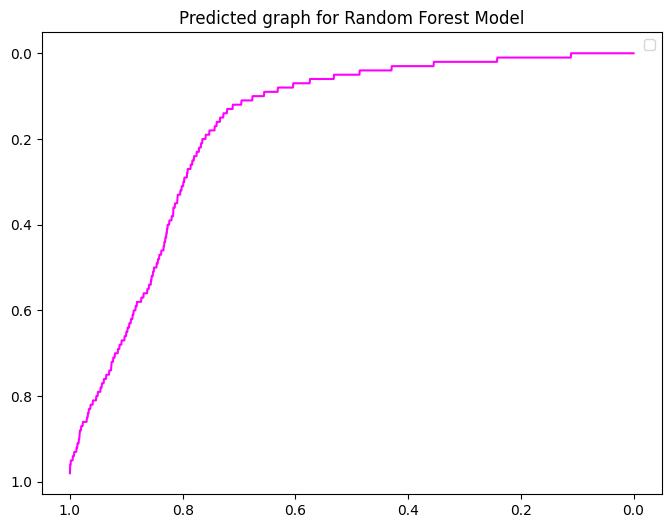

In [ ]:
# Generate instances in equal intervals
num_instances = len(sorted_probs)
instances = np.linspace(0, 1, num_instances)

# Plot the graph
plt.figure(figsize=(8, 6))
plt.plot(instances, sorted_probs,color='magenta')
plt.xlabel('')
plt.ylabel('')
plt.title('Predicted graph for Random Forest Model')
plt.legend()
plt.gca().invert_yaxis()
plt.gca().invert_xaxis()
plt.show()

In [ ]:
# Compare Several models according to their Accuracies
Model_Comparison = pd.DataFrame({
    'Model': ['Logistic Regression', 'Decision Tree', 'Random Forest'],
    'Score': [logmodel_accuracy, dt_accuracy, rf_accuracy]})
Model_Comparison_df = Model_Comparison.sort_values(by='Score', ascending=False)
Model_Comparison_df = Model_Comparison_df.set_index('Score')
Model_Comparison_df.reset_index()



,Score,Model
0,94.08,Random Forest
1,91.77,Decision Tree
2,83.90,Logistic Regression


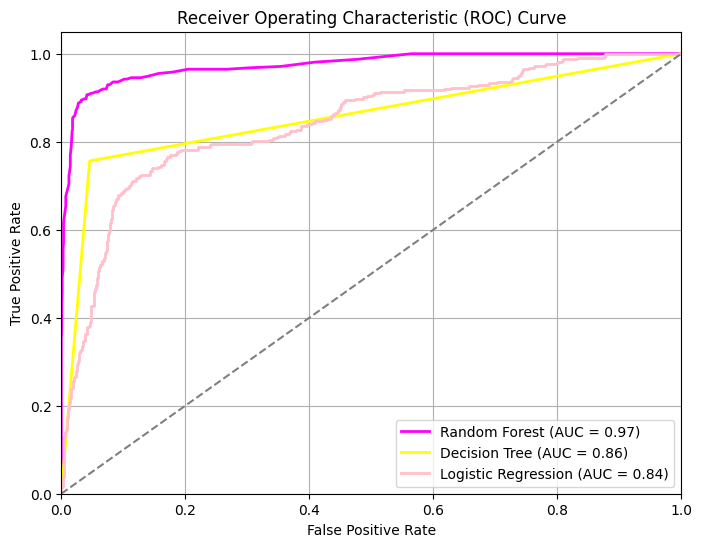

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Random Forest
rf_probabilities = rfmodel.predict_proba(X_test)[:, 1]
fpr_rf, tpr_rf, _ = roc_curve(y_test, rf_probabilities)
roc_auc_rf = auc(fpr_rf, tpr_rf)

# Decision Tree
dt_probabilities = dtmodel.predict_proba(X_test)[:, 1]
fpr_dt, tpr_dt, _ = roc_curve(y_test, dt_probabilities)
roc_auc_dt = auc(fpr_dt, tpr_dt)

# Logistic Regression
log_probabilities = logmodel.predict_proba(X_test)[:, 1]
fpr_log, tpr_log, _ = roc_curve(y_test, log_probabilities)
roc_auc_log = auc(fpr_log, tpr_log)

# Plot ROC curves
plt.figure(figsize=(8, 6))
plt.plot(fpr_rf, tpr_rf, color='magenta', lw=2, label='Random Forest (AUC = %0.2f)' % roc_auc_rf)
plt.plot(fpr_dt, tpr_dt, color='yellow', lw=2, label='Decision Tree (AUC = %0.2f)' % roc_auc_dt)
plt.plot(fpr_log, tpr_log, color='pink', lw=2, label='Logistic Regression (AUC = %0.2f)' % roc_auc_log)

# Plot random guessing line
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.grid(True)
plt.show()


In [ ]:
# Predict the probability of Churn of each customer
churn_dataset['Probability_of_Churn'] = logmodel.predict_proba(churn_dataset[X_test.columns])[:,1]

In [ ]:
# Create a Dataframe showcasing probability of Churn of each customer
churn_dataset[['CustomerID','Probability_of_Churn']].head()

,CustomerID,Probability_of_Churn
0,50001,0.284442
1,50002,0.142945
2,50003,0.178300
3,50004,0.507763
4,50005,0.397706


from matplotlib import pyplot as plt
_df_4['CustomerID'].plot(kind='hist', bins=20, title='CustomerID')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_5['Probability_of_Churn'].plot(kind='hist', bins=20, title='Probability_of_Churn')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_6.plot(kind='scatter', x='CustomerID', y='Probability_of_Churn', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['CustomerID']
  ys = series['Probability_of_Churn']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_7.sort_values('CustomerID', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('CustomerID')
_ = plt.ylabel('Probability_of_Churn')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['CustomerID']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'CustomerID'}, axis=1)
              .sort_values('CustomerID', ascending=True))
  xs = counted['CustomerID']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_8.sort_values('CustomerID', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('CustomerID')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_9['CustomerID'].plot(kind='line', figsize=(8, 4), title='CustomerID')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_10['Probability_of_Churn'].plot(kind='line', figsize=(8, 4), title='Probability_of_Churn')
plt.gca().spines[['top', 'right']].set_visible(False)

In [ ]:
churn_dataset.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5630 entries, 0 to 5629
Data columns (total 21 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   CustomerID                   5630 non-null   int64  
 1   Churn                        5630 non-null   int64  
 2   Tenure                       5630 non-null   float64
 3   CityTier                     5630 non-null   int64  
 4   WarehouseToHome              5630 non-null   float64
 5   HourSpendOnApp               5630 non-null   float64
 6   NumberOfDeviceRegistered     5630 non-null   int64  
 7   SatisfactionScore            5630 non-null   int64  
 8   NumberOfAddress              5630 non-null   int64  
 9   Complain                     5630 non-null   int64  
 10  OrderAmountHikeFromlastYear  5630 non-null   float64
 11  CouponUsed                   5630 non-null   float64
 12  OrderCount                   5630 non-null   float64
 13  DaySinceLastOrder 

In [ ]:
churn_dataset.sort_values(by=['Probability_of_Churn'], ascending=False).head(50)

,CustomerID,Churn,Tenure,CityTier,WarehouseToHome,HourSpendOnApp,NumberOfDeviceRegistered,SatisfactionScore,NumberOfAddress,Complain,...,CouponUsed,OrderCount,DaySinceLastOrder,CashbackAmount,PreferredLoginDevice_Cat,PreferredPaymentMode_Cat,Gender_Cat,PreferedOrderCat_Cat,MaritalStatus_Cat,Probability_of_Churn
1037,51038,1,0.0,3,16.0,2.0,4,5,10,0,...,4.0,6.0,0.0,203,1,3,1,0,1,0.723542
623,50624,1,0.0,3,35.0,3.0,5,5,9,0,...,0.0,2.0,2.0,150,0,3,1,2,2,0.717102
315,50316,1,0.0,2,29.0,2.0,3,5,10,1,...,1.0,1.0,2.0,200,0,6,0,0,1,0.717050
3075,53076,1,1.0,1,11.0,3.0,4,2,20,1,...,2.0,2.0,1.0,148,0,1,1,4,2,0.711738
2093,52094,1,0.0,3,35.0,3.0,5,5,9,0,...,1.0,2.0,2.0,150,0,3,1,2,2,0.711463
1785,51786,1,0.0,2,29.0,2.0,3,5,10,1,...,1.0,1.0,2.0,200,0,6,0,0,1,0.707497
3438,53439,1,1.0,3,36.0,4.0,6,5,10,0,...,1.0,3.0,3.0,175,0,3,1,2,2,0.700652
3130,53131,1,1.0,2,30.0,3.0,4,5,11,1,...,2.0,2.0,3.0,225,0,6,0,0,1,0.700599
2507,52508,1,0.0,3,16.0,2.0,4,5,10,0,...,0.0,6.0,0.0,203,1,3,1,0,1,0.698365
4908,54909,1,1.0,3,36.0,4.0,6,5,10,0,...,2.0,3.0,3.0,175,0,3,1,2,2,0.694825
